In [1]:
import numpy as np # linear algebra
import pandas as pd # Series and DataFrames
import scipy.stats as stats # this is for point-biserial correlation
import sklearn.linear_model
import plotly.subplots as sp 
import plotly.graph_objects as go

# import libraries for plotting
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


# from matplotlib import pyplot as plt

%matplotlib inline
plt.style.use('ggplot')
pd.set_option('display.max_rows', 500)
pd.options.display.float_format = '{:,.2f}'.format

from sklearn import preprocessing
from sklearn.preprocessing import PolynomialFeatures
from itertools import combinations
from scipy.stats import pearsonr
from sklearn.preprocessing import LabelEncoder
from itertools import combinations

In [2]:
from sklearn import __version__ as sklearn_version
print('Installed version for scikit-learn: {}.'.format(sklearn_version))

Installed version for scikit-learn: 1.4.0.


In [3]:
heart_disease = pd.read_csv("heart_disease_part1.csv")

In [4]:
data_dictionary=pd.read_csv("data_dictionary.csv", delimiter=";")

In [5]:
data_dictionary.drop('Unnamed: 2',axis=1,inplace=True)

In [6]:
heart_disease['Diabetic'].unique()

array(['Yes', 'No', 'No, borderline diabetes', 'Yes (during pregnancy)'],
      dtype=object)

In [7]:
heart_disease.head(100)

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease_FamilyHistory,State
0,0,16.60,1,0.00,0.00,3.00,30.00,0,Female,55-59,White,Yes,1,Very good,5.00,1,0,1.00,0.00,MT
1,0,20.34,0,NaN,1.00,0.00,0.00,0,Female,80 or older,White,No,1,Very good,7.00,0,0,0.00,NaN,VT
2,0,26.58,1,NaN,0.00,20.00,30.00,0,Male,65-69,White,Yes,1,Fair,8.00,1,0,0.00,NaN,WY
3,0,24.21,0,NaN,0.00,0.00,0.00,0,Female,75-79,White,No,0,Good,6.00,0,0,1.00,0.00,VT
4,0,23.71,0,0.00,0.00,28.00,0.00,1,Female,40-44,White,No,1,Very good,8.00,0,0,0.00,NaN,DC
5,1,28.87,1,0.00,0.00,6.00,0.00,1,Female,75-79,Black,No,0,Fair,10.00,0,0,0.00,NaN,PA
6,0,21.63,0,0.00,0.00,15.00,0.00,0,Female,70-74,White,No,1,Fair,4.00,1,0,1.00,NaN,AK
7,0,31.64,1,0.00,0.00,5.00,0.00,1,Female,80 or older,White,Yes,0,Good,9.00,1,0,0.00,NaN,KY
8,0,26.45,0,0.00,0.00,0.00,0.00,0,Female,80 or older,White,"No, borderline diabetes",0,Fair,5.00,0,1,0.00,NaN,MT
9,0,40.69,0,0.00,0.00,0.00,0.00,1,Male,65-69,White,No,1,Good,10.00,0,0,0.00,NaN,DE


In [8]:
def generate_categorical_cross_tabs(dataframe, selected_columns):
    cat_cross_tabs={}
    for i in range(len(selected_columns)):
        for j in range(i+1, len(selected_columns)):
            cross_tab_key = f"{selected_columns[i]}_vs_{selected_columns[j]}"
            cross_tab = pd.crosstab(heart_disease[selected_columns[i]], heart_disease[selected_columns[j]], 
                                    normalize='index') * 100
            cat_cross_tabs[cross_tab_key]=cross_tab
    return cat_cross_tabs


In [9]:
selected_columns = ['HeartDisease','Smoking', 'AlcoholDrinking','Stroke','DiffWalking','Sex','AgeCategory',
                   'Race','PhysicalActivity','GenHealth', 'Asthma','Diabetic', 'KidneyDisease','SkinCancer','HeartDisease_FamilyHistory','State']
categorical_tab_result = generate_categorical_cross_tabs(heart_disease, selected_columns)
for key, value in categorical_tab_result.items():
    print(f"Cross-Tab with percentages: {key}")
    print(value)
    print("\n" + "-"*40 + "\n" )

Cross-Tab with percentages: HeartDisease_vs_Smoking
Smoking          0     1
HeartDisease            
0            60.38 39.62
1            41.41 58.59

----------------------------------------

Cross-Tab with percentages: HeartDisease_vs_AlcoholDrinking
AlcoholDrinking  0.00  1.00
HeartDisease               
0               89.42 10.58
1               93.66  6.34

----------------------------------------

Cross-Tab with percentages: HeartDisease_vs_Stroke
Stroke        0.00  1.00
HeartDisease            
0            97.36  2.64
1            83.92 16.08

----------------------------------------

Cross-Tab with percentages: HeartDisease_vs_DiffWalking
DiffWalking      0     1
HeartDisease            
0            88.24 11.76
1            63.37 36.63

----------------------------------------

Cross-Tab with percentages: HeartDisease_vs_Sex
Sex           Female  Male
HeartDisease              
0              53.54 46.46
1              41.04 58.96

----------------------------------------

I am going to explain the cross-tabs.Here I only describe the improtant ones:


1. Smoking and heart disease

-----------------------------------
we can see that smoking and heart disease are correlated: as 58% of the people with heart disease are smokers and 60% of people who do not smoke don't develop heart disease. So heart disease and smoking has very strong correlation.
***

2. Heart_Disease and Stroke
16% of the people with heart disease had stroke

3. heart disease and difficulty walking:
36% of people with heart disease has difficulty walking

4.Heart Disease is more on the male individuals with 58% vs 41% in females

5. Heart disease and Age: this has obvious relationship as age group increases the percentage of individuals with heart disease increases from 0.47% in 18-24 to 12% in 60-64 year and to 17.7% in 70-74 years old and 19.9% in 80 years and older

6. Physicalactivity and heart disease: 78% of people who doesn't have heart disease were phyisically active.
7. people without heart disease has general health as very good 37% and good 28% and excellent22% with while individuals with heart disease have good, fair and very good with low percentage in excellent 5%.
8. 32% of the people with heart disease have diabets vs 10% of the individuals who doesn't ahve heart disease
9. 18% of heart disease cases have skin cancer while only 8.5% of the healthy individuals have skin cancer.
10. Heart disease and family history of heart disease seems doesn't make any differences in distribution.
11. Alcohol drinking and smokers distribution, the % of people who smoke and drink alcohol is more than % of 
12. the distribution of people who have stroke and smoke is more than the % of non=smokers who have stroke (   5.18% vs 2.81%)
13. Smokers who have difficulty walking has more percentage than the non-smokers
14. Male are more in smoker category than female
15. difficulty walking increases as age increases
16. More Females tend to have difficulty walking than males.
17. people who has stroke has more difficulty of walking than the individuals without any stroke background
18. People with stroke has more distribution under diabetic group.
19. distribution of people with kidney disease is higher in skin cancer than the people with no history of kidney disease
20. people with skin cancer and asthma have poorer general health
21. People with better general health tend to hav emore physical activity

### 2.1-4. Correlation between combination of variables and class<a class="anchor" id="variables_distribution"></a>

In [10]:
heart_disease.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease_FamilyHistory,State
0,0,16.60,1,0.00,0.00,3.00,30.00,0,Female,55-59,White,Yes,1,Very good,5.00,1,0,1.00,0.00,MT
1,0,20.34,0,NaN,1.00,0.00,0.00,0,Female,80 or older,White,No,1,Very good,7.00,0,0,0.00,NaN,VT
2,0,26.58,1,NaN,0.00,20.00,30.00,0,Male,65-69,White,Yes,1,Fair,8.00,1,0,0.00,NaN,WY
3,0,24.21,0,NaN,0.00,0.00,0.00,0,Female,75-79,White,No,0,Good,6.00,0,0,1.00,0.00,VT
4,0,23.71,0,0.00,0.00,28.00,0.00,1,Female,40-44,White,No,1,Very good,8.00,0,0,0.00,NaN,DC


As time is limitted and I cannot go through all the combinations while I am doing the 2-2 analysis after having some hypothesis. 
I list what I think would be valuable to see :

 What would be logical to effect determining a person has heart disease or not?

 **hypothesis**:

 lifestyle would have general impact on the prolonged and healthy life and heart. By healthy it means reasonable physically active (Normal BMI range is the result of that, and no difficulty walking is a must), good mental health status, noAlchoholic drinking, have 7-8 hours of night sleep, eat well, good general health, no family history, doesn't have heart-disease-family histroy, asthma also should have impact your heart(don't know about kidney disease and skin cancer aslo stroke(it is the same condition for brain but we should investigate more on this)). I guess in males there is more heart disease than females but not sure(I am telling this becasue average age of women is slightly more than men but it doesn't mean they are less likely to develop heart disease). Also people who are younger naturaly tend to have less probabiity of having heart disease, So, age should be a determinate factor on predicting to developheart disease.Cause the effect of smoking and alcohol drinking for who has been doing it for 20 years is different for a person who is young and socially smoking for just 1 year.
 I think interesting things to combine and see their correlation with heart disease are:
 As I haven't encode all the variables I can just use the correlation function for numerical ones. I will analyze the categoricals after encoding them. After encoding I will generate the correlation function vs. target and also for the selected variables that currently contain categorical.

 1. The relation between heart disease and people with good physical, mental health, BMI range,non-AlcoholDrinkers  is healthy and physical active with good general health and good sleep
 2. The relation between people who drink alchohol and smoke and their age with developing heart disease
 3. People with diabetics,  Asthma, age, family history and heart disease
 4. Correlation between people with rare (should be confirmed) disease kidney disease, skin cancer and heart disease 
 5. Correlation between stroke, age,sex and heart disease
 5. I also would long to see this correlation : young active individuals, young deactive individuals, old active and old deactive.
 6. I would like to see people with good general health and their chance of getting heart disease 
 7. I would like to see sex, race, age and heart disease
 8. correlation between race, state and age and heart disease
 


In [11]:
# 1 1. The relation between heart disease and people with good physical, mental health, BMI range,non-AlcoholDrinkers  
# is healthy and physical active with good general health and good sleep.
class_variable='HeartDisease'
variables= ['PhysicalHealth','MentalHealth','BMI','AlcoholDrinking','PhysicalActivity','SleepTime']
variables_to_include=[class_variable] + variables
corr_matrix = heart_disease[variables_to_include].corr()
corr_with_class=corr_matrix[class_variable]
print(corr_with_class)

HeartDisease        1.00
PhysicalHealth      0.17
MentalHealth        0.03
BMI                 0.05
AlcoholDrinking    -0.04
PhysicalActivity   -0.10
SleepTime           0.00
Name: HeartDisease, dtype: float64


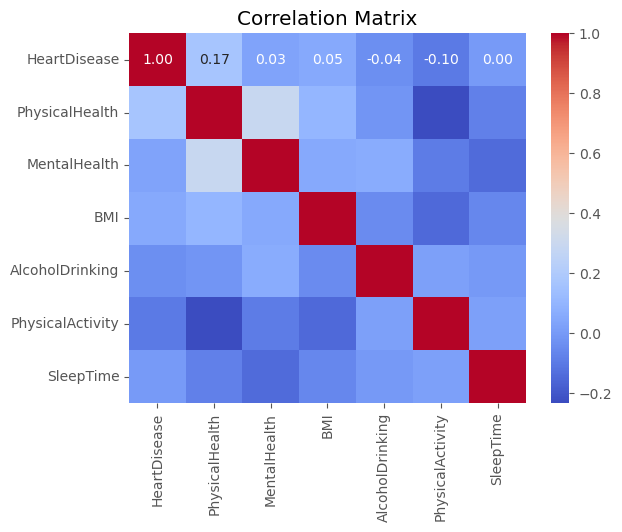

In [12]:
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

We can see that heartdisease has strong correlation with bad phyical physical health days 0.17 and physical activity (-0.1). Also tiny relationship with BMI and bad mental health days and no linear correlation with sleeptime.
Physical activity and physical health has -0.23 correlation.
Mental health and physical health are 0.29 correlated.
Let's look wider: as if something effectes badphysical health days and physical activity, it can have indirect effect on heart disease. 

In [13]:
selected_columns=['HeartDisease', 'BMI','PhysicalHealth', 'MentalHealth',
         'SleepTime','AlcoholDrinking','PhysicalActivity','Smoking','Stroke','DiffWalking',
         'Asthma','KidneyDisease','SkinCancer','HeartDisease_FamilyHistory']
selected_df= heart_disease[selected_columns]
correlation_matrix=selected_df.corr()
print(correlation_matrix)

                            HeartDisease   BMI  PhysicalHealth  MentalHealth  \
HeartDisease                        1.00  0.05            0.17          0.03   
BMI                                 0.05  1.00            0.10          0.06   
PhysicalHealth                      0.17  0.10            1.00          0.29   
MentalHealth                        0.03  0.06            0.29          1.00   
SleepTime                           0.00 -0.06           -0.08         -0.14   
AlcoholDrinking                    -0.04 -0.05           -0.02          0.06   
PhysicalActivity                   -0.10 -0.15           -0.23         -0.10   
Smoking                             0.11  0.02            0.12          0.09   
Stroke                              0.20  0.02            0.14          0.05   
DiffWalking                         0.20  0.17            0.43          0.15   
Asthma                              0.04  0.09            0.12          0.11   
KidneyDisease                       0.15

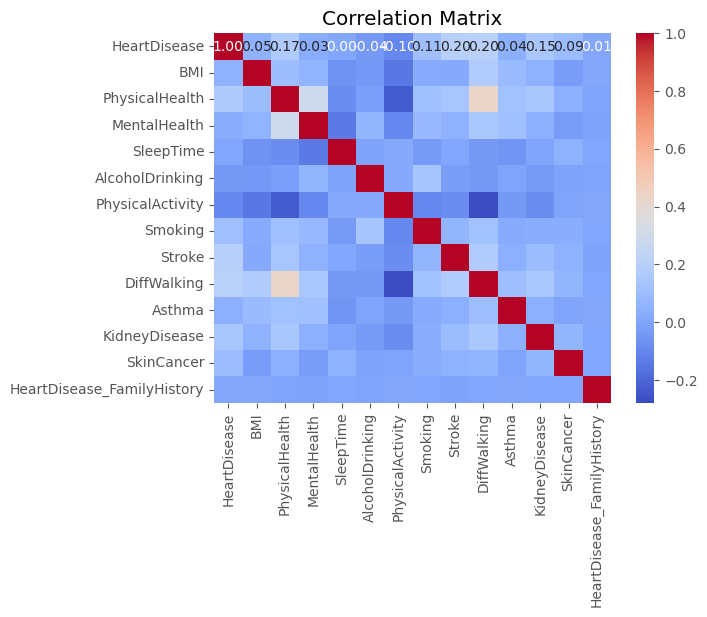

In [14]:
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

 We can see the correlation matrix in heatmap format
 1.  We can see that there are strong correlation between physical health and difficulty walking, 0.43 which is high
 2. mental health and physical health has 0.29 correlation
 3. Physical activity and physical health are -0.23 correlated
 4. Mental health and sleeptime has -0.14 correlation, which suggests as metal health deteriorates the sleeptime become less.
 5. Stroke and difficulty walking both are 0.2 correlated with heart disease
 6. Difficulty walking and BMI are related 0.17
 7. Physical activity and BMI are -0.15 correlated
 8. kidney disease with heart disease are correlated 0.15
 

Let's plot the correlation of all with heart disease

In [15]:
target_correlations=correlation_matrix['HeartDisease'].sort_values(ascending=False)
# As Exited is one I just droped it
target_correlations.drop('HeartDisease',axis=0,inplace=True)

In [16]:
target_correlations=target_correlations.reset_index().rename(columns={'index':'Feature','HeartDisease':'Correlation'})
target_correlations

,Feature,Correlation
0,DiffWalking,0.20
1,Stroke,0.20
2,PhysicalHealth,0.17
3,KidneyDisease,0.15
4,Smoking,0.11
5,SkinCancer,0.09
6,BMI,0.05
7,Asthma,0.04
8,MentalHealth,0.03
9,HeartDisease_FamilyHistory,0.01


In [17]:
# Absolute correlation shows the strength of correlation of features without considering whether they are inversely related or positively related
target_sorted_abs=target_correlations.set_index('Feature').abs()
target_sorted_abs.sort_values(by='Correlation',ascending=False).reset_index()

,Feature,Correlation
0,DiffWalking,0.20
1,Stroke,0.20
2,PhysicalHealth,0.17
3,KidneyDisease,0.15
4,Smoking,0.11
5,PhysicalActivity,0.10
6,SkinCancer,0.09
7,BMI,0.05
8,Asthma,0.04
9,AlcoholDrinking,0.04


In [18]:
merged_abs=pd.merge(target_sorted_abs,target_correlations,how='left',on='Feature',suffixes=('_sort_abs','_original'))

In [19]:
sort_highest_correlated=merged_abs.sort_values('Correlation_sort_abs',ascending=False)
sort_highest_correlated_new= sort_highest_correlated.reset_index(drop='True')
sort_highest_correlated_new

,Feature,Correlation_sort_abs,Correlation_original
0,DiffWalking,0.20,0.20
1,Stroke,0.20,0.20
2,PhysicalHealth,0.17,0.17
3,KidneyDisease,0.15,0.15
4,Smoking,0.11,0.11
5,PhysicalActivity,0.10,-0.10
6,SkinCancer,0.09,0.09
7,BMI,0.05,0.05
8,Asthma,0.04,0.04
9,AlcoholDrinking,0.04,-0.04


In [20]:
# sort based on absolute value by keeping the original value
fig=px.bar(sort_highest_correlated,x='Feature',
           y='Correlation_original',
           color='Correlation_sort_abs',
           color_continuous_scale=px.colors.sequential.Cividis,
           labels={'Correlation_original':'Correlation Coefficient','Feature':'Features','Correlation_sort_abs':'Strength of Correlation Hue'}, 
           category_orders={'feature':sort_highest_correlated['Feature']}  
  
)
fig.update_layout(title=dict(text="<b>Correlation of features to heart disease<b>",
                             x=0.4,y=0.95),
                             legend_title_text='Correlation strength of features to heart disease hue',

                             )
fig.show()

In [21]:
fig.update_traces(
    text=sort_highest_correlated['Correlation_original'].round(3),
    textposition='outside',
    textfont=dict(family='Arial',size=11,color='black')
     
)
fig.show()

We can see from the bar chart the most related features to heart disease are:
1. difficulty walking 0.2
2. stroke 0.19
3. Physical Health 0.17
4. kidney disease 0.15
5. smoking 0.1 
6. physical activity -0.1
7. skin cancer is 0.093 related
 and sleeptime and heart_disease family history are the two least correlated features.

### 3.1. Data Cleaning <a class="anchor" id="variables_distribution"></a>

3.1.1. Vairable types

In [22]:
heart_disease.head(10)

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease_FamilyHistory,State
0,0,16.60,1,0.00,0.00,3.00,30.00,0,Female,55-59,White,Yes,1,Very good,5.00,1,0,1.00,0.00,MT
1,0,20.34,0,NaN,1.00,0.00,0.00,0,Female,80 or older,White,No,1,Very good,7.00,0,0,0.00,NaN,VT
2,0,26.58,1,NaN,0.00,20.00,30.00,0,Male,65-69,White,Yes,1,Fair,8.00,1,0,0.00,NaN,WY
3,0,24.21,0,NaN,0.00,0.00,0.00,0,Female,75-79,White,No,0,Good,6.00,0,0,1.00,0.00,VT
4,0,23.71,0,0.00,0.00,28.00,0.00,1,Female,40-44,White,No,1,Very good,8.00,0,0,0.00,NaN,DC
5,1,28.87,1,0.00,0.00,6.00,0.00,1,Female,75-79,Black,No,0,Fair,10.00,0,0,0.00,NaN,PA
6,0,21.63,0,0.00,0.00,15.00,0.00,0,Female,70-74,White,No,1,Fair,4.00,1,0,1.00,NaN,AK
7,0,31.64,1,0.00,0.00,5.00,0.00,1,Female,80 or older,White,Yes,0,Good,9.00,1,0,0.00,NaN,KY
8,0,26.45,0,0.00,0.00,0.00,0.00,0,Female,80 or older,White,"No, borderline diabetes",0,Fair,5.00,0,1,0.00,NaN,MT
9,0,40.69,0,0.00,0.00,0.00,0.00,1,Male,65-69,White,No,1,Good,10.00,0,0,0.00,NaN,DE


In [23]:
heart_disease.dtypes

HeartDisease                    int64
BMI                           float64
Smoking                         int64
AlcoholDrinking               float64
Stroke                        float64
PhysicalHealth                float64
MentalHealth                  float64
DiffWalking                     int64
Sex                            object
AgeCategory                    object
Race                           object
Diabetic                       object
PhysicalActivity                int64
GenHealth                      object
SleepTime                     float64
Asthma                          int64
KidneyDisease                   int64
SkinCancer                    float64
HeartDisease_FamilyHistory    float64
State                          object
dtype: object

**List to change**
Boolean:
1. HeartDisease
2. Smoking  
3. AlcoholDrinking
4. Stroke
5. DiffWalking
6. PhysicalActivity 
7. Asthma
8. KidneyDisease
9. SkinCancer
10. 

Int
1. PhysicalHealth
2. MentalHealth
3. SleepTime



In [24]:
# Boolean
col_to_change= ['HeartDisease','Smoking','AlcoholDrinking', 'Stroke', 'DiffWalking', 
                'PhysicalActivity', 'Asthma', 'KidneyDisease','SkinCancer','HeartDisease_FamilyHistory']
dtype_mapping= {col:'boolean' for col in col_to_change}
heart_disease=heart_disease.astype(dtype_mapping)

In [25]:
heart_disease.dtypes

HeartDisease                  boolean
BMI                           float64
Smoking                       boolean
AlcoholDrinking               boolean
Stroke                        boolean
PhysicalHealth                float64
MentalHealth                  float64
DiffWalking                   boolean
Sex                            object
AgeCategory                    object
Race                           object
Diabetic                       object
PhysicalActivity              boolean
GenHealth                      object
SleepTime                     float64
Asthma                        boolean
KidneyDisease                 boolean
SkinCancer                    boolean
HeartDisease_FamilyHistory    boolean
State                          object
dtype: object

In [26]:
# Int : PhysicalHealth, MentalHealth, SleepTime
col_to_change= ['PhysicalHealth','MentalHealth','SleepTime']
dtype_mapping= {col:'int64' for col in col_to_change}
heart_disease=heart_disease.astype(dtype_mapping)

In [27]:
heart_disease.dtypes

HeartDisease                  boolean
BMI                           float64
Smoking                       boolean
AlcoholDrinking               boolean
Stroke                        boolean
PhysicalHealth                  int64
MentalHealth                    int64
DiffWalking                   boolean
Sex                            object
AgeCategory                    object
Race                           object
Diabetic                       object
PhysicalActivity              boolean
GenHealth                      object
SleepTime                       int64
Asthma                        boolean
KidneyDisease                 boolean
SkinCancer                    boolean
HeartDisease_FamilyHistory    boolean
State                          object
dtype: object

#### 3.1.2. Imputation of null values

In [28]:
heart_disease.isnull().sum()

HeartDisease                       0
BMI                                0
Smoking                            0
AlcoholDrinking               106811
Stroke                          1112
PhysicalHealth                     0
MentalHealth                       0
DiffWalking                        0
Sex                                0
AgeCategory                        0
Race                               0
Diabetic                           0
PhysicalActivity                   0
GenHealth                          0
SleepTime                          0
Asthma                             0
KidneyDisease                      0
SkinCancer                       349
HeartDisease_FamilyHistory    284532
State                              0
dtype: int64

The nulls are in boolean category: I would fill them with values. For Heart disease family history as it has so many missing values and doesn't have considerable  correlation with other values I am going to drop the column. 

In [29]:
heart_disease.drop(columns='HeartDisease_FamilyHistory', inplace= True)

In [30]:
heart_disease.isnull().sum()

HeartDisease             0
BMI                      0
Smoking                  0
AlcoholDrinking     106811
Stroke                1112
PhysicalHealth           0
MentalHealth             0
DiffWalking              0
Sex                      0
AgeCategory              0
Race                     0
Diabetic                 0
PhysicalActivity         0
GenHealth                0
SleepTime                0
Asthma                   0
KidneyDisease            0
SkinCancer             349
State                    0
dtype: int64

In [31]:
heart_disease['AlcoholDrinking'].describe()

count     212984
unique         2
top        False
freq      191207
Name: AlcoholDrinking, dtype: object

I would do the random choice fillna s based on the probability of True and False, for alcohol column

In [32]:
true_probability=heart_disease['AlcoholDrinking'].value_counts(normalize=True).get(True,0)
false_probability= 1 - true_probability
random_choices= np.random.choice([True, False], 
                                  size=heart_disease['AlcoholDrinking'].isna().sum(),
                                  p=[true_probability,false_probability]
)
heart_disease.loc[heart_disease['AlcoholDrinking'].isna(),'AlcoholDrinking'] = random_choices
missing_values = heart_disease['AlcoholDrinking'].isna().sum()
print(f"Number of missing values in 'AlcoholicDrinking after filling: {missing_values}")

Number of missing values in 'AlcoholicDrinking after filling: 0


In [33]:
heart_disease['AlcoholDrinking'].describe()

count     319795
unique         2
top        False
freq      287068
Name: AlcoholDrinking, dtype: object

In [34]:
# Stroke
heart_disease['Stroke'].describe()

count     318683
unique         2
top        False
freq      306614
Name: Stroke, dtype: object

In [35]:
heart_disease.isnull().sum()

HeartDisease           0
BMI                    0
Smoking                0
AlcoholDrinking        0
Stroke              1112
PhysicalHealth         0
MentalHealth           0
DiffWalking            0
Sex                    0
AgeCategory            0
Race                   0
Diabetic               0
PhysicalActivity       0
GenHealth              0
SleepTime              0
Asthma                 0
KidneyDisease          0
SkinCancer           349
State                  0
dtype: int64

In [36]:
# I would fillna s in  stroke with 0 as the amount is relatively low and the 
# frequency of false occurances is so many and it is one of the strongest correlated to heart disease so I want to be careful
heart_disease['Stroke']=heart_disease['Stroke'].fillna(False)

In [37]:
heart_disease.isnull().sum()

HeartDisease          0
BMI                   0
Smoking               0
AlcoholDrinking       0
Stroke                0
PhysicalHealth        0
MentalHealth          0
DiffWalking           0
Sex                   0
AgeCategory           0
Race                  0
Diabetic              0
PhysicalActivity      0
GenHealth             0
SleepTime             0
Asthma                0
KidneyDisease         0
SkinCancer          349
State                 0
dtype: int64

In [38]:
heart_disease['SkinCancer'].describe()

count     319446
unique         2
top        False
freq      289627
Name: SkinCancer, dtype: object

In [39]:
# I am going to fill the null values in Skin cancer to false I can also drop them but I prefer to keep other records
heart_disease['SkinCancer']=heart_disease['SkinCancer'].fillna(False)

In [40]:
heart_disease.isnull().sum()

HeartDisease        0
BMI                 0
Smoking             0
AlcoholDrinking     0
Stroke              0
PhysicalHealth      0
MentalHealth        0
DiffWalking         0
Sex                 0
AgeCategory         0
Race                0
Diabetic            0
PhysicalActivity    0
GenHealth           0
SleepTime           0
Asthma              0
KidneyDisease       0
SkinCancer          0
State               0
dtype: int64

Now that all of the null values are filled with relative values, let's handle the outliers:
Numerical columns with outliers:
1. BMI
2. PhysicalHealth
3. Mental Helath
4.  Sleeptime


In [41]:
# BMI already has been set to max and min of inbound range which is meaningful
heart_disease['BMI'].describe()
# Max is 42 and min is 13: we have values ranging from 12.2 to 119 


count   319,795.00
mean         28.13
std           5.73
min          13.00
25%          24.03
50%          27.34
75%          31.44
max          42.00
Name: BMI, dtype: float64

In [42]:
# 2. PhysicalHealth
# uppenfence was 5 and max was 30 and lowerfence and min was 0, i would change all the values more than 5 to 5
heart_disease[(heart_disease['PhysicalHealth']>5)].shape

(47146, 19)

In [43]:
heart_disease[(heart_disease['PhysicalHealth']==5)].shape

(7606, 19)

In [44]:
heart_disease['PhysicalHealth'] =heart_disease['PhysicalHealth'].clip(upper=5)

In [45]:
heart_disease['PhysicalHealth'].describe()

count   319,795.00
mean          1.12
std           1.93
min           0.00
25%           0.00
50%           0.00
75%           2.00
max           5.00
Name: PhysicalHealth, dtype: float64

In [46]:
fig=px.box(heart_disease, y='PhysicalHealth')
fig.update_layout(
    title='<b>Box Plot of self-declared not physically-healthy days in the last 30days</b>',
)
fig.show()

In [47]:
# 3. Mental Health
heart_disease['MentalHealth'].describe() # upperfence is 7
# Clip to upper fence like physical health
heart_disease['MentalHealth'] =heart_disease['MentalHealth'].clip(upper=7)



In [48]:
heart_disease['MentalHealth'].describe()

count   319,795.00
mean          1.80
std           2.76
min           0.00
25%           0.00
50%           0.00
75%           3.00
max           7.00
Name: MentalHealth, dtype: float64

In [49]:
fig=px.box(heart_disease, y='MentalHealth')
fig.update_layout(
    title='<b>Box Plot of self-declared not mentally-healthy days in the last 30days</b>',
)
fig.show()

In [50]:
# 4. Sleeptime
heart_disease['SleepTime'].describe()
# I already cut the lower and upper range to a more normal range which is 4 to 10, no person can sleep on average less or more than that range:
# before it was between 1 and 24

count   319,795.00
mean          7.08
std           1.26
min           4.00
25%           6.00
50%           7.00
75%           8.00
max          10.00
Name: SleepTime, dtype: float64

In [51]:
fig=px.box(heart_disease, y='SleepTime')
fig.update_layout(
    title='<b>Box Plot of self-declared average sleep hours per day</b>',
)
fig.show()

***

Now we have our outliers handled let's go to the next section which is :

3.1.4. Elimination of features with less variance

I have already decide to remove the heart_disease_family_history as it has so many missing values and does't have correlation with heart disease or other features so it was insufficient and I decided to remove. No let's see which one is a  low variance:

In [52]:
heart_disease.apply(lambda x: x.nunique(), axis=0)

HeartDisease           2
BMI                 2366
Smoking                2
AlcoholDrinking        2
Stroke                 2
PhysicalHealth         6
MentalHealth           8
DiffWalking            2
Sex                    2
AgeCategory           14
Race                   6
Diabetic               4
PhysicalActivity       2
GenHealth              5
SleepTime              7
Asthma                 2
KidneyDisease          2
SkinCancer             2
State                 51
dtype: int64

There is no low variance amon the features

***
### 3.2.  Data transformation <a class="anchor" id="variables_distribution"></a>

In [53]:
heart_disease.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,State
0,False,16.60,True,False,False,3,7,False,Female,55-59,White,Yes,True,Very good,5,True,False,True,MT
1,False,20.34,False,False,True,0,0,False,Female,80 or older,White,No,True,Very good,7,False,False,False,VT
2,False,26.58,True,False,False,5,7,False,Male,65-69,White,Yes,True,Fair,8,True,False,False,WY
3,False,24.21,False,True,False,0,0,False,Female,75-79,White,No,False,Good,6,False,False,True,VT
4,False,23.71,False,False,False,5,0,True,Female,40-44,White,No,True,Very good,8,False,False,False,DC


In [54]:
heart_disease.describe()

,BMI,PhysicalHealth,MentalHealth,SleepTime
count,"319,795.00","319,795.00","319,795.00","319,795.00"
mean,28.13,1.12,1.80,7.08
std,5.73,1.93,2.76,1.26
min,13.00,0.00,0.00,4.00
25%,24.03,0.00,0.00,6.00
50%,27.34,0.00,0.00,7.00
75%,31.44,2.00,3.00,8.00
max,42.00,5.00,7.00,10.00


In [55]:
heart_disease.describe(include='object')

,Sex,AgeCategory,Race,Diabetic,GenHealth,State
count,319795,319795,319795,319795,319795,319795
unique,2,14,6,4,5,51
top,Female,65-69,White,No,Very good,OH
freq,167805,34143,245212,269653,113858,6429


In [56]:
heart_disease.describe(include='bool')

,HeartDisease,Smoking,AlcoholDrinking,Stroke,DiffWalking,PhysicalActivity,Asthma,KidneyDisease,SkinCancer
count,319795,319795,319795,319795,319795,319795,319795,319795,319795
unique,2,2,2,2,2,2,2,2,2
top,False,False,False,False,False,True,False,False,False
freq,292422,187887,287068,307726,275385,247957,276923,308016,289976


**Categorical variables:**
1. All the yes/ no variables are now converted to 0/1 boolean type: Heart Disease, Smoking, AlcoholDrinking, Stroke, Diffwalking, Physical Activity, Asthma, kidney disease, skin Cancer, HeartDisease_Fmaily History
2. One-Hot enconding: Diabetics, sex, Age category, Race, State 
3. Labeling: GenHealth
Numerical variables:

**Categorizatioon of Numercial variables:**

 1. BMI categories
 2. Physical health
 3. Mental Health
 3. sleep time

In [57]:
heart_disease.columns

Index(['HeartDisease', 'BMI', 'Smoking', 'AlcoholDrinking', 'Stroke',
       'PhysicalHealth', 'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory',
       'Race', 'Diabetic', 'PhysicalActivity', 'GenHealth', 'SleepTime',
       'Asthma', 'KidneyDisease', 'SkinCancer', 'State'],
      dtype='object')

In [58]:
# One-Hot enconding: Diabetics, sex, Age category, Race, State 
# 1. Diabetics
categorical_columns = ['Diabetic', 'Sex', 'AgeCategory', 'Race', 'State' ]
heart_disease=pd.get_dummies(heart_disease,columns=categorical_columns)

In [59]:
heart_disease.columns

Index(['HeartDisease', 'BMI', 'Smoking', 'AlcoholDrinking', 'Stroke',
       'PhysicalHealth', 'MentalHealth', 'DiffWalking', 'PhysicalActivity',
       'GenHealth', 'SleepTime', 'Asthma', 'KidneyDisease', 'SkinCancer',
       'Diabetic_No', 'Diabetic_No, borderline diabetes', 'Diabetic_Yes',
       'Diabetic_Yes (during pregnancy)', 'Sex_Female', 'Sex_Male',
       'AgeCategory_18-24', 'AgeCategory_25-29', 'AgeCategory_30-34',
       'AgeCategory_35-39', 'AgeCategory_40-44', 'AgeCategory_45-49',
       'AgeCategory_50-54', 'AgeCategory_55-59', 'AgeCategory_60-64',
       'AgeCategory_65-69', 'AgeCategory_70-74', 'AgeCategory_75-79',
       'AgeCategory_80 or older', 'AgeCategory_Unknown',
       'Race_American Indian/Alaskan Native', 'Race_Asian', 'Race_Black',
       'Race_Hispanic', 'Race_Other', 'Race_White', 'State_AK', 'State_AL',
       'State_AR', 'State_AZ', 'State_CA', 'State_CO', 'State_CT', 'State_DC',
       'State_DE', 'State_FL', 'State_GA', 'State_HI', 'State_IA', 'Stat

In [60]:
heart_disease.T

,0,1,2,3,4,5,6,7,8,9,...,319785,319786,319787,319788,319789,319790,319791,319792,319793,319794
HeartDisease,False,False,False,False,False,True,False,False,False,False,...,False,True,False,False,False,True,False,False,False,False
BMI,16.60,20.34,26.58,24.21,23.71,28.87,21.63,31.64,26.45,40.69,...,31.93,33.20,36.54,23.38,22.22,27.41,29.84,24.24,32.81,42.00
Smoking,True,False,True,False,False,True,False,True,False,False,...,False,True,False,False,False,True,True,False,False,False
AlcoholDrinking,False,False,False,True,False,False,False,False,False,False,...,True,False,False,False,False,False,False,False,False,False
Stroke,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
PhysicalHealth,3,0,5,0,5,5,5,5,0,0,...,0,0,5,0,0,5,0,0,0,0
MentalHealth,7,0,7,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DiffWalking,False,False,False,False,True,True,False,True,False,True,...,False,False,False,False,False,True,False,False,False,False
PhysicalActivity,True,True,True,False,True,False,True,False,False,True,...,True,True,False,True,True,False,True,True,False,True
GenHealth,Very good,Very good,Fair,Good,Very good,Fair,Fair,Good,Fair,Good,...,Good,Very good,Good,Excellent,Excellent,Fair,Very good,Good,Good,Good


In [61]:
heart_disease.drop(columns='Sex_Male',inplace=True) # As we have only female and male who are mutually exclusive, one of them is enough.

In [62]:
heart_disease.columns.T

Index(['HeartDisease', 'BMI', 'Smoking', 'AlcoholDrinking', 'Stroke',
       'PhysicalHealth', 'MentalHealth', 'DiffWalking', 'PhysicalActivity',
       'GenHealth', 'SleepTime', 'Asthma', 'KidneyDisease', 'SkinCancer',
       'Diabetic_No', 'Diabetic_No, borderline diabetes', 'Diabetic_Yes',
       'Diabetic_Yes (during pregnancy)', 'Sex_Female', 'AgeCategory_18-24',
       'AgeCategory_25-29', 'AgeCategory_30-34', 'AgeCategory_35-39',
       'AgeCategory_40-44', 'AgeCategory_45-49', 'AgeCategory_50-54',
       'AgeCategory_55-59', 'AgeCategory_60-64', 'AgeCategory_65-69',
       'AgeCategory_70-74', 'AgeCategory_75-79', 'AgeCategory_80 or older',
       'AgeCategory_Unknown', 'Race_American Indian/Alaskan Native',
       'Race_Asian', 'Race_Black', 'Race_Hispanic', 'Race_Other', 'Race_White',
       'State_AK', 'State_AL', 'State_AR', 'State_AZ', 'State_CA', 'State_CO',
       'State_CT', 'State_DC', 'State_DE', 'State_FL', 'State_GA', 'State_HI',
       'State_IA', 'State_ID', 'Stat

In [63]:
# labeling GenralHealth
heart_disease['GenHealth'].unique()

array(['Very good', 'Fair', 'Good', 'Poor', 'Excellent'], dtype=object)

In [64]:
label_mapping= {'Poor':1,'Fair':2,'Good':3,'Very good':4,'Excellent':5}
heart_disease['GenHealth']=heart_disease['GenHealth'].map(label_mapping)

In [65]:
heart_disease['GenHealth'].unique()

array([4, 2, 3, 1, 5], dtype=int64)

In [66]:
heart_disease[heart_disease['GenHealth']==5].T

,19,41,55,61,79,82,85,94,95,100,...,319736,319737,319741,319742,319744,319751,319772,319783,319788,319789
HeartDisease,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
BMI,18.13,28.13,24.02,21.03,30.56,24.37,23.78,23.96,19.49,24.80,...,25.69,22.08,33.66,22.78,26.63,34.96,30.90,33.28,23.38,22.22
Smoking,False,False,False,False,True,True,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
AlcoholDrinking,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Stroke,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
PhysicalHealth,0,0,5,1,0,0,0,0,0,5,...,0,0,0,0,0,0,0,0,0,0
MentalHealth,0,0,0,0,0,0,5,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DiffWalking,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
PhysicalActivity,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
GenHealth,5,5,5,5,5,5,5,5,5,5,...,5,5,5,5,5,5,5,5,5,5


In [67]:
heart_disease[heart_disease['BMI'] <16].shape[0]

691

Now, let's look into categorizing numerical variables:

**Categorization of Numercial variables:**

 1. BMI categories
 2. Physical health
 3. Mental Health
 3. sleep time

#### BMI : 
- Underweight (Severe thinness)	< 16.0	
- Underweight (Moderate thinness)	16.0 – 16.9
- Underweight (Mild thinness)	17.0 – 18.4	
- Normal range	18.5 – 24.9	
- Overweight (Pre-obese)	25.0 – 29.9	
- Obese (Class I)	30.0 – 34.9	
- Obese (Class II)	35.0 – 39.9	
- Obese (Class III)	≥ 40.0	

In [68]:
bins= [0, 16,16.9,18.4,24.9,29.9,34.9,39.9,float('inf')]
labels=['Severe thinness','Moderate thinness','Mild thinness','Normal range','Overweight',
        'Obese (Class I)','Obese (Class II)',' Obese (Class III)']
heart_disease['BMI'] = pd.cut(heart_disease['BMI'],bins=bins,labels=labels,right=False)


In [69]:
heart_disease=pd.get_dummies(heart_disease,columns=['BMI'])

In [70]:
heart_disease[heart_disease['BMI_Severe thinness']].shape[0]

691

In [71]:
heart_disease.columns

Index(['HeartDisease', 'Smoking', 'AlcoholDrinking', 'Stroke',
       'PhysicalHealth', 'MentalHealth', 'DiffWalking', 'PhysicalActivity',
       'GenHealth', 'SleepTime', 'Asthma', 'KidneyDisease', 'SkinCancer',
       'Diabetic_No', 'Diabetic_No, borderline diabetes', 'Diabetic_Yes',
       'Diabetic_Yes (during pregnancy)', 'Sex_Female', 'AgeCategory_18-24',
       'AgeCategory_25-29', 'AgeCategory_30-34', 'AgeCategory_35-39',
       'AgeCategory_40-44', 'AgeCategory_45-49', 'AgeCategory_50-54',
       'AgeCategory_55-59', 'AgeCategory_60-64', 'AgeCategory_65-69',
       'AgeCategory_70-74', 'AgeCategory_75-79', 'AgeCategory_80 or older',
       'AgeCategory_Unknown', 'Race_American Indian/Alaskan Native',
       'Race_Asian', 'Race_Black', 'Race_Hispanic', 'Race_Other', 'Race_White',
       'State_AK', 'State_AL', 'State_AR', 'State_AZ', 'State_CA', 'State_CO',
       'State_CT', 'State_DC', 'State_DE', 'State_FL', 'State_GA', 'State_HI',
       'State_IA', 'State_ID', 'State_IL', 

In [72]:
heart_disease[heart_disease['BMI_Normal range']==1].shape[0]

95339

In [73]:
# Physical health
heart_disease['PhysicalHealth'].describe()

count   319,795.00
mean          1.12
std           1.93
min           0.00
25%           0.00
50%           0.00
75%           2.00
max           5.00
Name: PhysicalHealth, dtype: float64

In [74]:
heart_disease[heart_disease['PhysicalHealth']==0].shape[0]

226589

In [75]:
heart_disease[heart_disease['PhysicalHealth'] >= 5].shape[0]

54752

In [76]:
heart_disease_test=heart_disease.copy()

In [77]:
# Physical health

bins= [0, 1, 3, 5, float('inf')]
labels=['0 bad physical_day','1-2 bad physical_days','3-4 bad physical_days','5 or more bad_physical_days']
heart_disease['PhysicalHealth'] = pd.cut(heart_disease['PhysicalHealth'],bins=bins,labels=labels,right=False)


In [78]:
heart_disease_test['PhysicalHealth']

0         3
1         0
2         5
3         0
4         5
         ..
319790    5
319791    0
319792    0
319793    0
319794    0
Name: PhysicalHealth, Length: 319795, dtype: int64

In [79]:
heart_disease=pd.get_dummies(heart_disease,columns=['PhysicalHealth'])

In [80]:
heart_disease.columns.T

Index(['HeartDisease', 'Smoking', 'AlcoholDrinking', 'Stroke', 'MentalHealth',
       'DiffWalking', 'PhysicalActivity', 'GenHealth', 'SleepTime', 'Asthma',
       'KidneyDisease', 'SkinCancer', 'Diabetic_No',
       'Diabetic_No, borderline diabetes', 'Diabetic_Yes',
       'Diabetic_Yes (during pregnancy)', 'Sex_Female', 'AgeCategory_18-24',
       'AgeCategory_25-29', 'AgeCategory_30-34', 'AgeCategory_35-39',
       'AgeCategory_40-44', 'AgeCategory_45-49', 'AgeCategory_50-54',
       'AgeCategory_55-59', 'AgeCategory_60-64', 'AgeCategory_65-69',
       'AgeCategory_70-74', 'AgeCategory_75-79', 'AgeCategory_80 or older',
       'AgeCategory_Unknown', 'Race_American Indian/Alaskan Native',
       'Race_Asian', 'Race_Black', 'Race_Hispanic', 'Race_Other', 'Race_White',
       'State_AK', 'State_AL', 'State_AR', 'State_AZ', 'State_CA', 'State_CO',
       'State_CT', 'State_DC', 'State_DE', 'State_FL', 'State_GA', 'State_HI',
       'State_IA', 'State_ID', 'State_IL', 'State_IN', 'State

In [81]:
# Mental Health
heart_disease['MentalHealth'].describe()

count   319,795.00
mean          1.80
std           2.76
min           0.00
25%           0.00
50%           0.00
75%           3.00
max           7.00
Name: MentalHealth, dtype: float64

In [82]:
# Physical health
bins= [0, 1, 3, 5, 7, float('inf')]
labels=['0 bad mental_day','1-2 bad mental_days','3-4 bad mental_days','5-6 bad mental_days','7 or more bad_mental_days']
heart_disease['MentalHealth'] = pd.cut(heart_disease['MentalHealth'],bins=bins,labels=labels,right=False)

In [83]:
heart_disease=pd.get_dummies(heart_disease,columns=['MentalHealth'])

In [84]:
heart_disease.columns.T

Index(['HeartDisease', 'Smoking', 'AlcoholDrinking', 'Stroke', 'DiffWalking',
       'PhysicalActivity', 'GenHealth', 'SleepTime', 'Asthma', 'KidneyDisease',
       ...
       'BMI_ Obese (Class III)', 'PhysicalHealth_0 bad physical_day',
       'PhysicalHealth_1-2 bad physical_days',
       'PhysicalHealth_3-4 bad physical_days',
       'PhysicalHealth_5 or more bad_physical_days',
       'MentalHealth_0 bad mental_day', 'MentalHealth_1-2 bad mental_days',
       'MentalHealth_3-4 bad mental_days', 'MentalHealth_5-6 bad mental_days',
       'MentalHealth_7 or more bad_mental_days'],
      dtype='object', length=104)

In [85]:
heart_disease.head().T

,0,1,2,3,4
HeartDisease,False,False,False,False,False
Smoking,True,False,True,False,False
AlcoholDrinking,False,False,False,True,False
Stroke,False,True,False,False,False
DiffWalking,False,False,False,False,True
PhysicalActivity,True,True,True,False,True
GenHealth,4,4,2,3,4
SleepTime,5,7,8,6,8
Asthma,True,False,True,False,False
KidneyDisease,False,False,False,False,False


In [86]:
heart_disease_test.head().T

,0,1,2,3,4
HeartDisease,False,False,False,False,False
Smoking,True,False,True,False,False
AlcoholDrinking,False,False,False,True,False
Stroke,False,True,False,False,False
PhysicalHealth,3,0,5,0,5
MentalHealth,7,0,7,0,0
DiffWalking,False,False,False,False,True
PhysicalActivity,True,True,True,False,True
GenHealth,4,4,2,3,4
SleepTime,5,7,8,6,8


In [87]:
heart_disease['SleepTime'].describe()

count   319,795.00
mean          7.08
std           1.26
min           4.00
25%           6.00
50%           7.00
75%           8.00
max          10.00
Name: SleepTime, dtype: float64

In [88]:
heart_disease[heart_disease['SleepTime']< 5].shape[0]

11081

In [89]:
heart_disease['SleepTime'].unique()

array([ 5,  7,  8,  6, 10,  4,  9], dtype=int64)

In [90]:
heart_disease_test = heart_disease.copy()

In [91]:
heart_disease[heart_disease['SleepTime']<5].shape[0]

11081

In [92]:
# Sleep time
bins= [4, 6, 7, 9, float('inf')]
labels=['Lack of Sleep','Enough sleepers','Excellent Sleepers','Long Sleepers']
heart_disease['SleepTime'] = pd.cut(heart_disease['SleepTime'],bins=bins,labels=labels,right=False)

In [93]:
heart_disease=pd.get_dummies(heart_disease,columns=['SleepTime'])

In [94]:
heart_disease.head().T

,0,1,2,3,4
HeartDisease,False,False,False,False,False
Smoking,True,False,True,False,False
AlcoholDrinking,False,False,False,True,False
Stroke,False,True,False,False,False
DiffWalking,False,False,False,False,True
PhysicalActivity,True,True,True,False,True
GenHealth,4,4,2,3,4
Asthma,True,False,True,False,False
KidneyDisease,False,False,False,False,False
SkinCancer,True,False,False,True,False


### 3.3. Feature Engineering <a class="anchor" id="variables_distribution"></a>

I have already done some feature engineering, by labeling the BMI, Sleeptime and physical and mental health, however I would like to do the following:

1. alcohol_smoking combination

2. Age group: I want to merge age groups : 18-34 as young, 34-60 middle-age, 60+ seniors



In [95]:
# Alcohol_Smoker Combinations
heart_disease['Smoker_Drinker'] = heart_disease['AlcoholDrinking'] & heart_disease ['Smoking']
heart_disease['Only_Smoker'] = heart_disease ['Smoking'] & ~heart_disease['AlcoholDrinking'] 
heart_disease['Only_Drinker']= heart_disease['AlcoholDrinking'] & ~heart_disease ['Smoking']
heart_disease['healthy_nonDrinker_nonSmoker'] = ~heart_disease ['Smoking'] & ~heart_disease['AlcoholDrinking']
heart_disease = heart_disease.drop(['AlcoholDrinking','Smoking'], axis=1)

In [96]:
heart_disease.head().T

,0,1,2,3,4
HeartDisease,False,False,False,False,False
Stroke,False,True,False,False,False
DiffWalking,False,False,False,False,True
PhysicalActivity,True,True,True,False,True
GenHealth,4,4,2,3,4
Asthma,True,False,True,False,False
KidneyDisease,False,False,False,False,False
SkinCancer,True,False,False,True,False
Diabetic_No,False,True,False,True,True
"Diabetic_No, borderline diabetes",False,False,False,False,False


In [97]:
#2. Age group: I want to merge age groups : 18-34 as young, 34-60 middle-age, 60+ seniors
heart_disease['AgeCategory_young'] = heart_disease['AgeCategory_18-24'] | heart_disease['AgeCategory_25-29'] | heart_disease['AgeCategory_30-34']  |heart_disease['AgeCategory_35-39']

In [98]:
heart_disease['AgeCategory_MiddleAge'] = heart_disease['AgeCategory_40-44'] | heart_disease['AgeCategory_45-49'] | heart_disease['AgeCategory_50-54']  |heart_disease['AgeCategory_55-59']

In [99]:
heart_disease['AgeCategory_Senior'] = heart_disease['AgeCategory_60-64'] | heart_disease['AgeCategory_65-69'] | heart_disease['AgeCategory_70-74']  |heart_disease['AgeCategory_75-79']  |heart_disease['AgeCategory_80 or older']

In [100]:
heart_disease['AgeCategory_unknown']=heart_disease['AgeCategory_Unknown'] 

In [101]:
heart_disease.head().T

,0,1,2,3,4
HeartDisease,False,False,False,False,False
Stroke,False,True,False,False,False
DiffWalking,False,False,False,False,True
PhysicalActivity,True,True,True,False,True
GenHealth,4,4,2,3,4
Asthma,True,False,True,False,False
KidneyDisease,False,False,False,False,False
SkinCancer,True,False,False,True,False
Diabetic_No,False,True,False,True,True
"Diabetic_No, borderline diabetes",False,False,False,False,False


In [102]:
heart_disease.drop('AgeCategory_Unknown',axis=1,inplace=True)

In [103]:
heart_disease.drop(['AgeCategory_18-24','AgeCategory_25-29','AgeCategory_30-34',
                    'AgeCategory_35-39','AgeCategory_40-44','AgeCategory_45-49',
                           'AgeCategory_50-54','AgeCategory_55-59','AgeCategory_60-64','AgeCategory_65-69','AgeCategory_70-74','AgeCategory_75-79',
                           'AgeCategory_80 or older'],axis=1,inplace=True)

In [104]:
heart_disease.head().T

,0,1,2,3,4
HeartDisease,False,False,False,False,False
Stroke,False,True,False,False,False
DiffWalking,False,False,False,False,True
PhysicalActivity,True,True,True,False,True
GenHealth,4,4,2,3,4
Asthma,True,False,True,False,False
KidneyDisease,False,False,False,False,False
SkinCancer,True,False,False,True,False
Diabetic_No,False,True,False,True,True
"Diabetic_No, borderline diabetes",False,False,False,False,False


I want to see whether I need the states or not,let's look into it, first the correlation matrix

In [105]:
# correlation function:
correlation_matrix=heart_disease.corr()

In [106]:
correlation_matrix

,HeartDisease,Stroke,DiffWalking,PhysicalActivity,GenHealth,Asthma,KidneyDisease,SkinCancer,Diabetic_No,"Diabetic_No, borderline diabetes",...,SleepTime_Excellent Sleepers,SleepTime_Long Sleepers,Smoker_Drinker,Only_Smoker,Only_Drinker,healthy_nonDrinker_nonSmoker,AgeCategory_young,AgeCategory_MiddleAge,AgeCategory_Senior,AgeCategory_unknown
HeartDisease,1.00,0.20,0.20,-0.10,-0.24,0.04,0.15,0.09,-0.17,0.02,...,-0.05,0.05,-0.00,0.11,-0.03,-0.09,-0.15,-0.09,0.21,-0.00
Stroke,0.20,1.00,0.17,-0.08,-0.17,0.04,0.09,0.05,-0.10,0.01,...,-0.04,0.05,-0.00,0.06,-0.02,-0.05,-0.09,-0.04,0.12,-0.00
DiffWalking,0.20,0.17,1.00,-0.28,-0.41,0.10,0.15,0.06,-0.21,0.03,...,-0.13,0.08,-0.00,0.12,-0.04,-0.10,-0.18,-0.05,0.20,-0.00
PhysicalActivity,-0.10,-0.08,-0.28,1.00,0.28,-0.04,-0.08,-0.00,0.14,-0.02,...,0.11,-0.07,-0.01,-0.09,0.03,0.08,0.09,0.02,-0.09,-0.00
GenHealth,-0.24,-0.17,-0.41,0.28,1.00,-0.14,-0.17,-0.05,0.27,-0.05,...,0.17,-0.07,-0.02,-0.17,0.05,0.15,0.15,0.03,-0.16,0.00
Asthma,0.04,0.04,0.10,-0.04,-0.14,1.00,0.04,-0.00,-0.05,0.02,...,-0.06,0.01,0.00,0.02,-0.00,-0.02,0.04,0.01,-0.05,0.00
KidneyDisease,0.15,0.09,0.15,-0.08,-0.17,0.04,1.00,0.06,-0.14,0.00,...,-0.04,0.03,-0.01,0.04,-0.02,-0.03,-0.08,-0.04,0.11,-0.00
SkinCancer,0.09,0.05,0.06,-0.00,-0.05,-0.00,0.06,1.00,-0.03,0.01,...,0.02,0.03,0.00,0.03,-0.01,-0.03,-0.17,-0.10,0.24,0.00
Diabetic_No,-0.17,-0.10,-0.21,0.14,0.27,-0.05,-0.14,-0.03,1.00,-0.34,...,0.06,-0.04,0.03,-0.07,0.03,0.04,0.17,0.03,-0.18,0.00
"Diabetic_No, borderline diabetes",0.02,0.01,0.03,-0.02,-0.05,0.02,0.00,0.01,-0.34,1.00,...,-0.01,0.00,-0.00,0.01,-0.01,-0.00,-0.04,-0.01,0.04,-0.00


I would say that states doesn't have any correlation with anything so for dimension reduction I am going to drop them.Also the same is true  for age_category unknown so I am going to drop them.



In [107]:
heart_disease.drop(columns='AgeCategory_unknown',inplace=True)

In [108]:
heart_disease.head().T

,0,1,2,3,4
HeartDisease,False,False,False,False,False
Stroke,False,True,False,False,False
DiffWalking,False,False,False,False,True
PhysicalActivity,True,True,True,False,True
GenHealth,4,4,2,3,4
Asthma,True,False,True,False,False
KidneyDisease,False,False,False,False,False
SkinCancer,True,False,False,True,False
Diabetic_No,False,True,False,True,True
"Diabetic_No, borderline diabetes",False,False,False,False,False


In [109]:
# Drop columns with State_
state_columns=heart_disease.filter(like='State_')

In [110]:
state_columns.columns

Index(['State_AK', 'State_AL', 'State_AR', 'State_AZ', 'State_CA', 'State_CO',
       'State_CT', 'State_DC', 'State_DE', 'State_FL', 'State_GA', 'State_HI',
       'State_IA', 'State_ID', 'State_IL', 'State_IN', 'State_KS', 'State_KY',
       'State_LA', 'State_MA', 'State_MD', 'State_ME', 'State_MI', 'State_MN',
       'State_MO', 'State_MS', 'State_MT', 'State_NC', 'State_ND', 'State_NE',
       'State_NH', 'State_NJ', 'State_NM', 'State_NV', 'State_NY', 'State_OH',
       'State_OK', 'State_OR', 'State_PA', 'State_RI', 'State_SC', 'State_SD',
       'State_TN', 'State_TX', 'State_UT', 'State_VA', 'State_VT', 'State_WA',
       'State_WI', 'State_WV', 'State_WY'],
      dtype='object')

In [111]:
heart_disease.drop(columns=state_columns, inplace=True)

In [112]:
heart_disease.head().T

,0,1,2,3,4
HeartDisease,False,False,False,False,False
Stroke,False,True,False,False,False
DiffWalking,False,False,False,False,True
PhysicalActivity,True,True,True,False,True
GenHealth,4,4,2,3,4
Asthma,True,False,True,False,False
KidneyDisease,False,False,False,False,False
SkinCancer,True,False,False,True,False
Diabetic_No,False,True,False,True,True
"Diabetic_No, borderline diabetes",False,False,False,False,False


In [113]:
correlation_matrix=heart_disease.corr()

In [114]:
correlation_matrix

,HeartDisease,Stroke,DiffWalking,PhysicalActivity,GenHealth,Asthma,KidneyDisease,SkinCancer,Diabetic_No,"Diabetic_No, borderline diabetes",...,SleepTime_Enough sleepers,SleepTime_Excellent Sleepers,SleepTime_Long Sleepers,Smoker_Drinker,Only_Smoker,Only_Drinker,healthy_nonDrinker_nonSmoker,AgeCategory_young,AgeCategory_MiddleAge,AgeCategory_Senior
HeartDisease,1.00,0.20,0.20,-0.10,-0.24,0.04,0.15,0.09,-0.17,0.02,...,-0.01,-0.05,0.05,-0.00,0.11,-0.03,-0.09,-0.15,-0.09,0.21
Stroke,0.20,1.00,0.17,-0.08,-0.17,0.04,0.09,0.05,-0.10,0.01,...,-0.01,-0.04,0.05,-0.00,0.06,-0.02,-0.05,-0.09,-0.04,0.12
DiffWalking,0.20,0.17,1.00,-0.28,-0.41,0.10,0.15,0.06,-0.21,0.03,...,0.01,-0.13,0.08,-0.00,0.12,-0.04,-0.10,-0.18,-0.05,0.20
PhysicalActivity,-0.10,-0.08,-0.28,1.00,0.28,-0.04,-0.08,-0.00,0.14,-0.02,...,-0.02,0.11,-0.07,-0.01,-0.09,0.03,0.08,0.09,0.02,-0.09
GenHealth,-0.24,-0.17,-0.41,0.28,1.00,-0.14,-0.17,-0.05,0.27,-0.05,...,-0.05,0.17,-0.07,-0.02,-0.17,0.05,0.15,0.15,0.03,-0.16
Asthma,0.04,0.04,0.10,-0.04,-0.14,1.00,0.04,-0.00,-0.05,0.02,...,0.02,-0.06,0.01,0.00,0.02,-0.00,-0.02,0.04,0.01,-0.05
KidneyDisease,0.15,0.09,0.15,-0.08,-0.17,0.04,1.00,0.06,-0.14,0.00,...,-0.00,-0.04,0.03,-0.01,0.04,-0.02,-0.03,-0.08,-0.04,0.11
SkinCancer,0.09,0.05,0.06,-0.00,-0.05,-0.00,0.06,1.00,-0.03,0.01,...,-0.03,0.02,0.03,0.00,0.03,-0.01,-0.03,-0.17,-0.10,0.24
Diabetic_No,-0.17,-0.10,-0.21,0.14,0.27,-0.05,-0.14,-0.03,1.00,-0.34,...,-0.01,0.06,-0.04,0.03,-0.07,0.03,0.04,0.17,0.03,-0.18
"Diabetic_No, borderline diabetes",0.02,0.01,0.03,-0.02,-0.05,0.02,0.00,0.01,-0.34,1.00,...,0.01,-0.01,0.00,-0.00,0.01,-0.01,-0.00,-0.04,-0.01,0.04


Now we are ready to move on to machine learning solution :) 
What has been done so far:
1. Made sense of the concept of the dataset and understands the concepts
2. Univariate and multivariate analysis and data understanding with extensive analysis of target class and its correlation with others and error handling
3. Cleaning the data, null values and outliers, and transforming the categorical into numerical and categorizing some numerical values.
4. Feature engineering: combining features to get new features and deleting some otehr features respectively
5. Dimension reduction: deleting the columns with any correlation over the dataset

In [118]:
heart_disease.to_csv('heart_disease_cleaned.csv')